## **WGAN-GP**

In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as dataset
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from tqdm.auto import tqdm

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def show(images, num_images, size, nrows):
  grid = make_grid(((images + 1) / 2).detach().cpu()[:num_images], nrow=nrows).permute(1,2,0).squeeze()
  plt.imshow(grid)
  plt.show()

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
    # transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
data = dataset.MNIST('MNIST', train=True,
                         transform=transform, download=True)
data_loader = DataLoader(data, batch_size=128,
                         shuffle=True)

In [ ]:
for _, data in enumerate(data_loader):
  images = data[0]

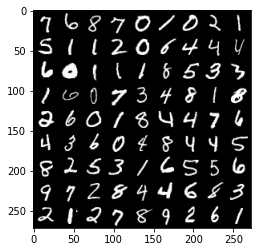

In [ ]:
show(images, 81, (1,32,32), 9)

## **Generator**

In [ ]:
def generator_block(input, output, kernel_size=3, stride=2, last_layer=False):
  if not last_layer:
    x = nn.Sequential(
        nn.ConvTranspose2d(in_channels=input, out_channels=output,
                           kernel_size=kernel_size, stride=stride),
        nn.BatchNorm2d(output),
        nn.ReLU(inplace=True)
    )
  else:
    x = nn.Sequential(
        nn.ConvTranspose2d(in_channels=input, out_channels=output,
                           kernel_size=kernel_size, stride=stride),
        nn.Tanh()
    )
  return x

In [ ]:
class Generator(nn.Module):
  def __init__(self, noise_dim, image_dim, hidden_dim):
    super(Generator, self).__init__()
    self.noise_dim = noise_dim
    self.generator = nn.Sequential(
        generator_block(noise_dim, hidden_dim * 4),
        generator_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
        generator_block(hidden_dim * 2, hidden_dim),
        generator_block(hidden_dim, image_dim, kernel_size=4, last_layer=True)
    )

  def forward(self, noise):
    x = noise.view(len(noise), self.noise_dim, 1, 1)
    # print(x.shape)
    x = self.generator(x)
    # print(x.shape)
    return x

In [ ]:
def get_noise_vectors(n_samples, noise_dim, device='cpu'):
  return torch.randn(n_samples, noise_dim, device=device)

## **Critic**

In [ ]:
def critic_block(input, output, kernel_size=4, stride=2, last_layer=False):
  if not last_layer:
    x = nn.Sequential(
        nn.Conv2d(in_channels=input, out_channels=output, 
                  kernel_size=kernel_size, stride=stride),
        nn.BatchNorm2d(output),
        nn.LeakyReLU(0.2, inplace=True)
    )
  else:
    x = nn.Sequential(
        nn.Conv2d(in_channels=input, out_channels=output,
                  kernel_size=kernel_size, stride=stride)
    )
  return x

In [ ]:
class Critic(nn.Module):
  def __init__(self, image_dim, hidden_dim):
    super(Critic, self).__init__()
    self.critic = nn.Sequential(
        critic_block(image_dim, hidden_dim),
        critic_block(hidden_dim, hidden_dim * 2),
        critic_block(hidden_dim * 2, 1, last_layer=True)
    )

  def forward(self, image):
    x = self.critic(image)
    return x.view(len(x), -1)

## **Training**

In [ ]:
epochs = 100
noise_dim = 64
step = 50
lr = 0.0002
batch_size = 128
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
cr_per_gen_update = 5

device = 'cuda'

image_channels = 1
hidden_dim_gen = 64
hidden_dim_critic = 64

In [ ]:
generator = Generator(noise_dim, image_channels, hidden_dim_gen).to(device)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta_1, beta_2))
critic = Critic(image_channels, hidden_dim_critic).to(device)
critic_optimizer = torch.optim.Adam(critic.parameters(), lr=lr, betas=(beta_1, beta_2))

def init_weights(layer):
  if isinstance(layer, nn.Conv2d) or isinstance(layer, nn.ConvTranspose2d):
    torch.nn.init.normal_(layer.weight, 0.0, 0.02)
  if isinstance(layer, nn.BatchNorm2d):
    torch.nn.init.normal_(layer.weight, 0.0, 0.02)
    torch.nn.init.constant_(layer.bias, 0)

generator = generator.apply(init_weights)
critic = critic.apply(init_weights)

## **Gradient Penalty**

- Step 1: Compute the gradient w.r.t the images (real and generated).
- Step 2: Compute the gradient penalty using the gradients obtained from the previous step.

In [ ]:
def calc_gradient(critic, real, fake, ep):
  # (ep * real) + fake * (1 - ep)
  mixed = ep * real + fake * (1 - ep)
  mixed_score = critic(mixed)
  gradient = torch.autograd.grad(outputs=mixed_score,
                                 inputs=mixed,
                                 grad_outputs=torch.ones_like(mixed_score),
                                 retain_graph=True,
                                 create_graph=True)[0]
  return gradient

In [ ]:
def gradient_penalty(gradient):
  gradient = gradient.view(len(gradient), -1)
  grad_norm = gradient.norm(2, dim=1)
  penalty = torch.mean((grad_norm - 1) ** 2)
  return penalty

## **Calculating Losses of Generator and Critic**
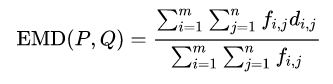

In [ ]:
def gen_loss(critic_fake_pred):
  loss = -1. * torch.mean(critic_fake_pred)
  return loss

In [ ]:
def critic_loss(critic_fake_pred, critic_real_pred, gp, c_lambda):
  loss = torch.mean(critic_fake_pred) - torch.mean(critic_real_pred) + c_lambda * gp
  return loss

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50: Generator Loss: -0.016949029164388774, Critic Loss: 1.8231535564661019


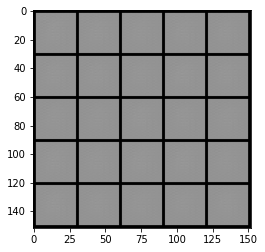

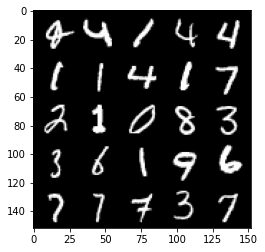

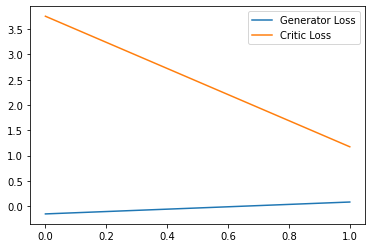

Step 100: Generator Loss: 1.4213318771868944, Critic Loss: -2.596738609850407


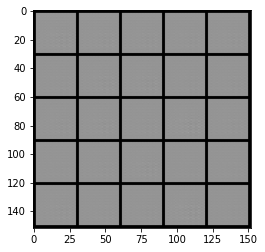

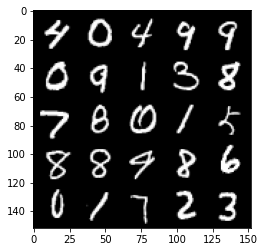

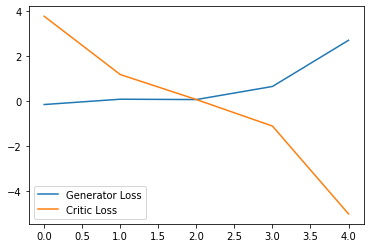

Step 150: Generator Loss: 3.057112839221954, Critic Loss: -12.875291128158572


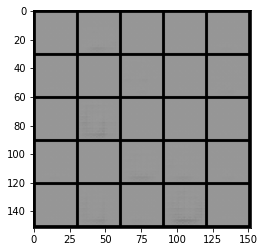

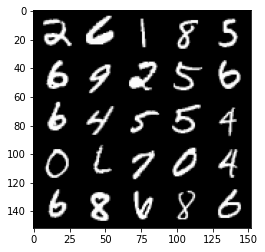

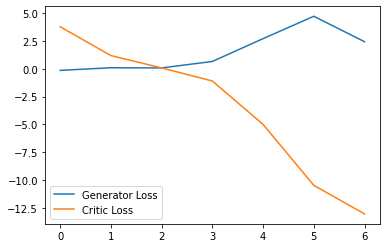

Step 200: Generator Loss: 0.34357760220766065, Critic Loss: -28.886620391845703


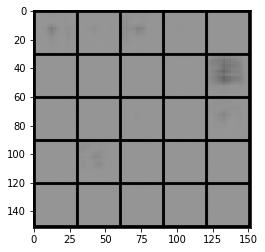

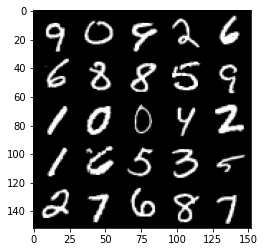

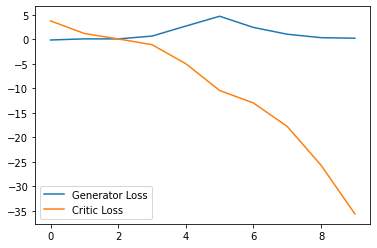

Step 250: Generator Loss: 1.5520082551240921, Critic Loss: -61.31323355102538


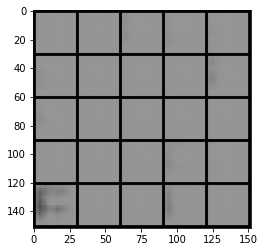

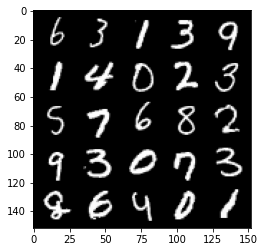

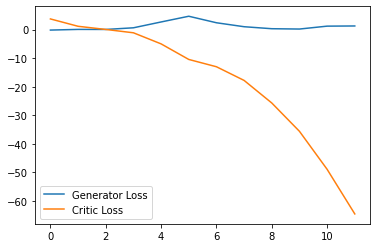

Step 300: Generator Loss: 5.181542901992798, Critic Loss: -107.75319668579097


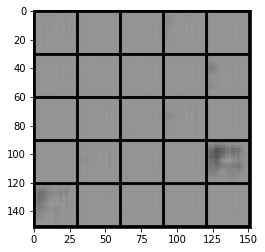

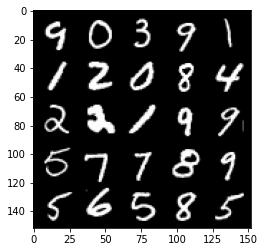

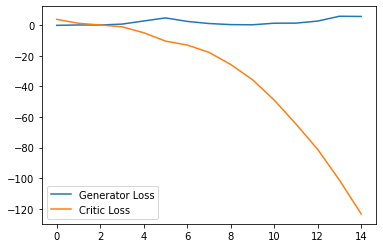

Step 350: Generator Loss: 6.188989839553833, Critic Loss: -159.8921388244629


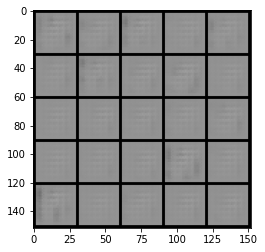

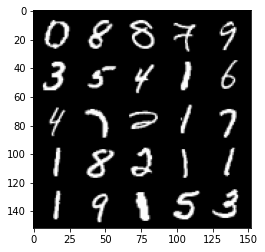

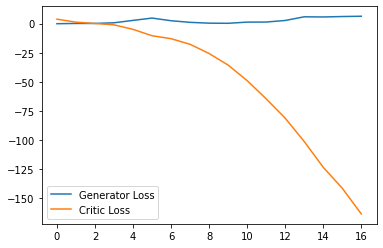

Step 400: Generator Loss: 7.238502027988434, Critic Loss: -212.4234014892578


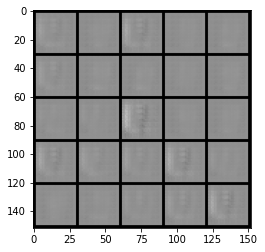

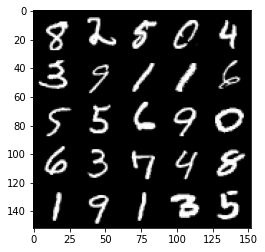

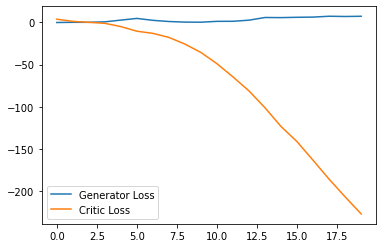

Step 450: Generator Loss: 5.285084255635739, Critic Loss: -265.04984423828125


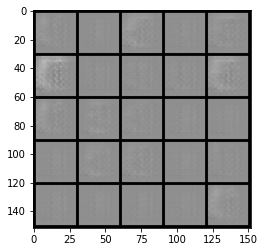

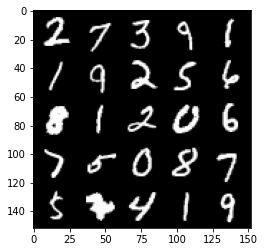

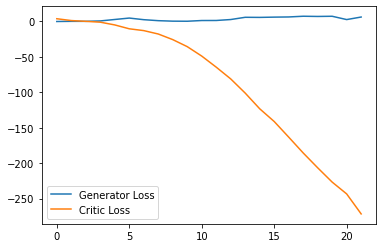

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator Loss: 3.7451195919513705, Critic Loss: -322.2072849731446


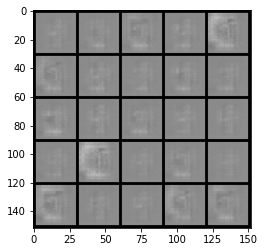

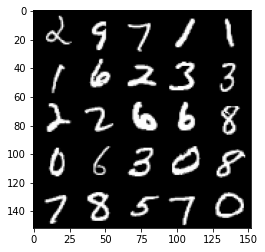

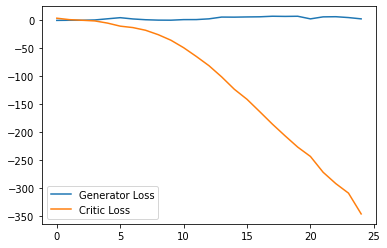

Step 550: Generator Loss: 2.040117086470127, Critic Loss: -384.5315922851563


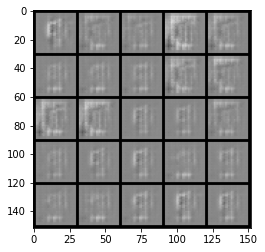

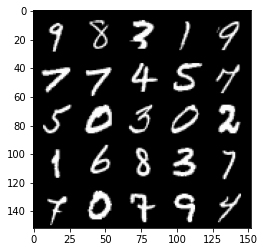

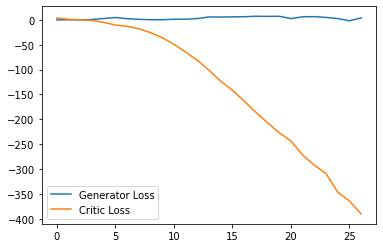

Step 600: Generator Loss: 2.3822788682579996, Critic Loss: -456.0193807373048


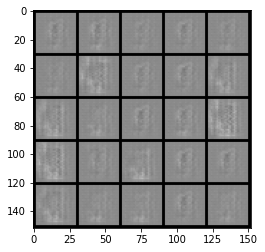

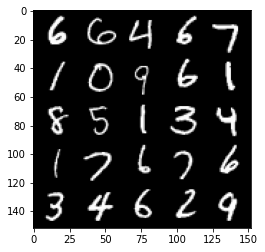

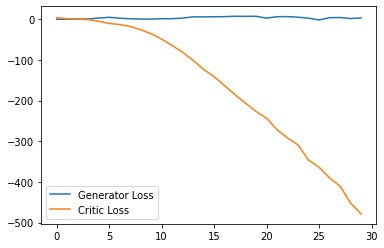

Step 650: Generator Loss: 2.9443165600299834, Critic Loss: -487.57013598632807


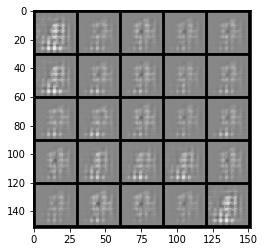

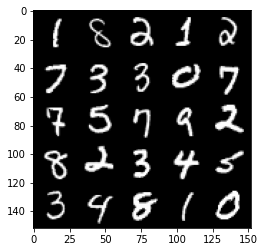

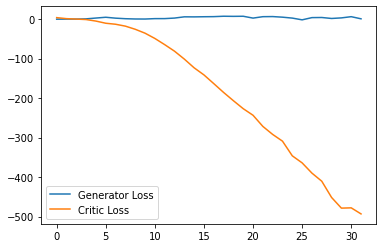

Step 700: Generator Loss: 7.210560038089752, Critic Loss: -537.9490817260743


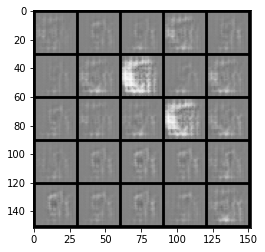

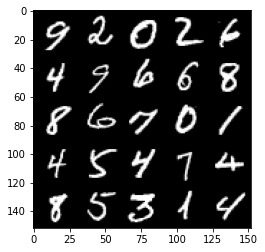

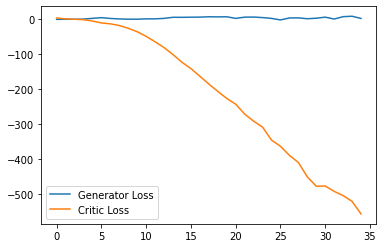

Step 750: Generator Loss: -7.499258034229278, Critic Loss: -596.7354526367188


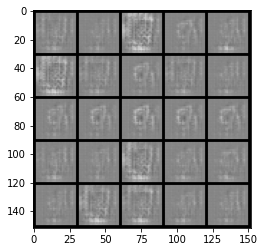

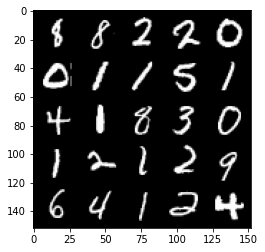

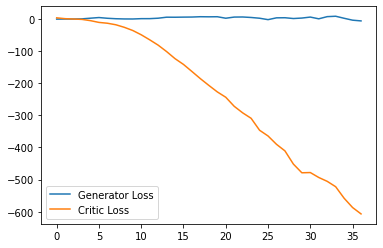

Step 800: Generator Loss: -9.862691009044648, Critic Loss: -608.5414134521485


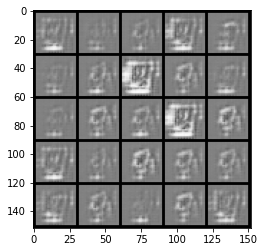

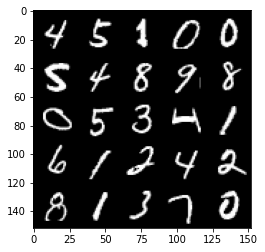

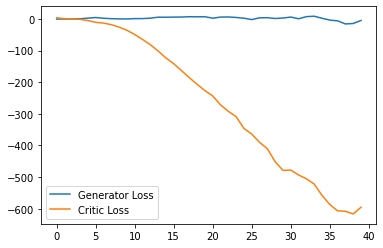

Step 850: Generator Loss: -0.7382375541329383, Critic Loss: -711.208364868164


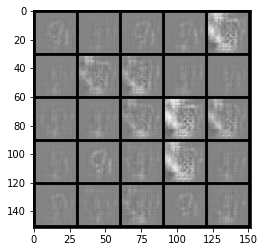

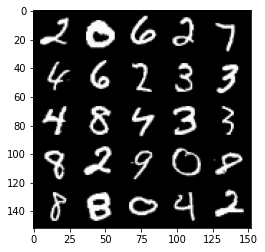

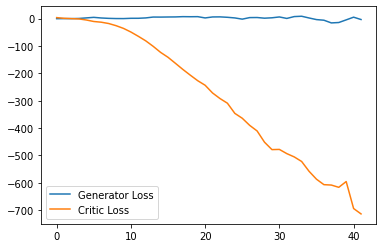

Step 900: Generator Loss: -3.6212062221765517, Critic Loss: -774.0811953125002


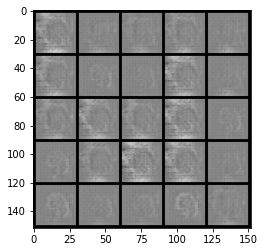

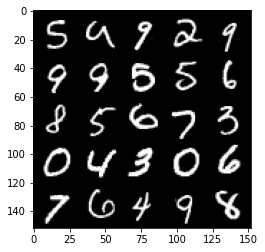

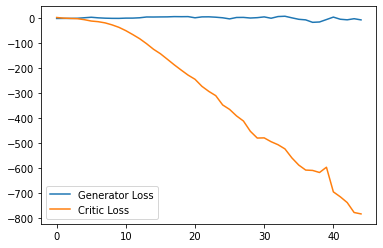

  0%|          | 0/469 [00:00<?, ?it/s]

Step 950: Generator Loss: -9.429660604000091, Critic Loss: -809.9096018676755


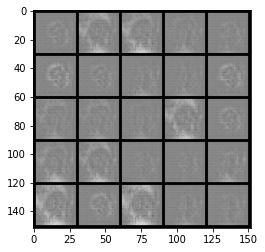

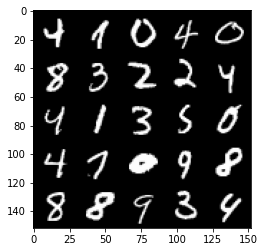

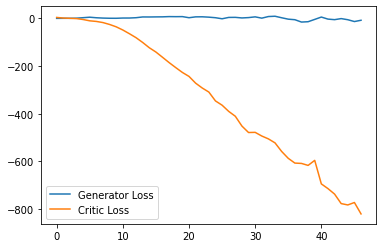

Step 1000: Generator Loss: -2.0048048374056817, Critic Loss: -879.5606159667971


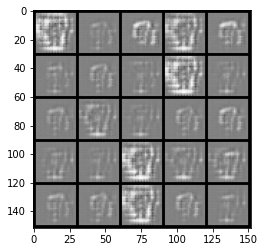

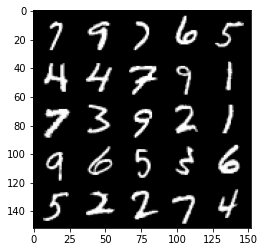

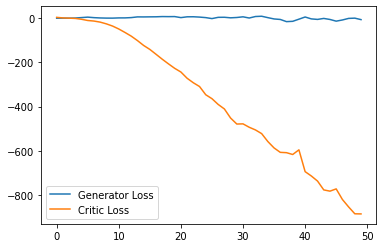

Step 1050: Generator Loss: 1.8327338290214539, Critic Loss: -881.3941525878907


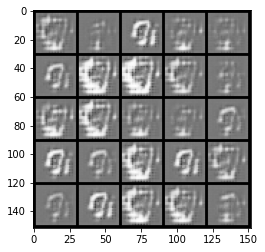

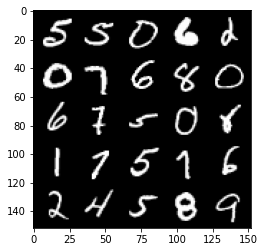

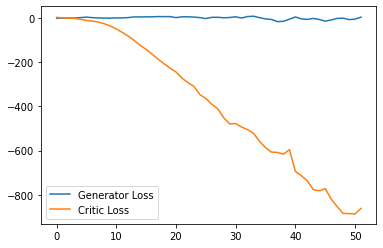

Step 1100: Generator Loss: -6.583317005634308, Critic Loss: -826.6553782958987


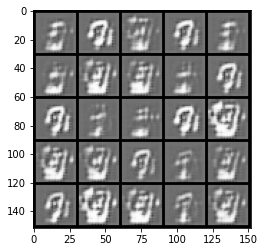

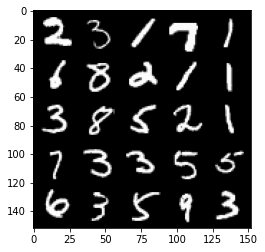

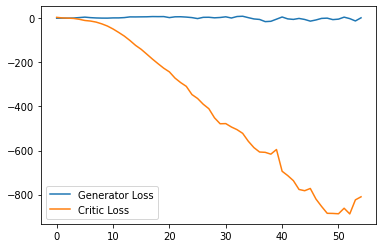

Step 1150: Generator Loss: -11.585495548248291, Critic Loss: -803.0336227416996


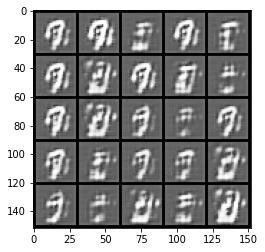

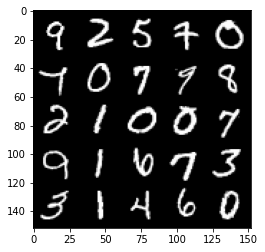

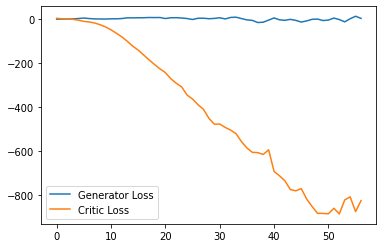

Step 1200: Generator Loss: -45.41387940645218, Critic Loss: -726.2081076660158


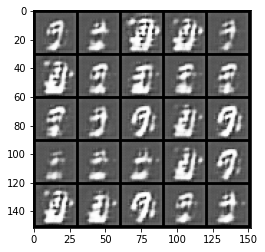

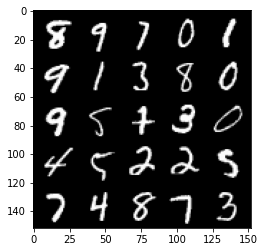

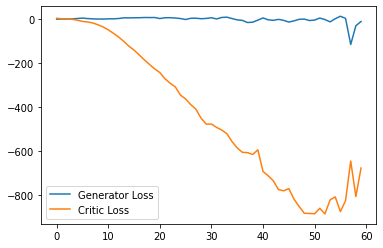

Step 1250: Generator Loss: -39.17909114599228, Critic Loss: -640.7412602539063


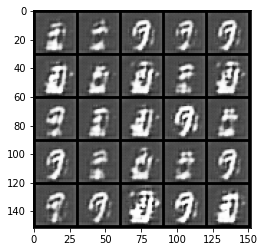

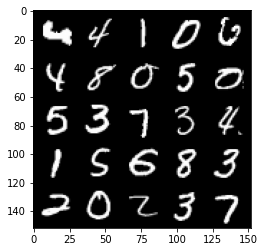

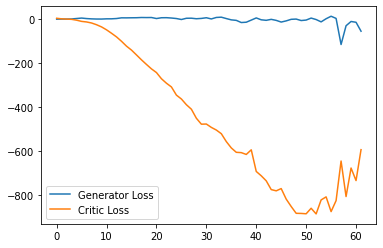

Step 1300: Generator Loss: -32.17742917180061, Critic Loss: -537.822695739746


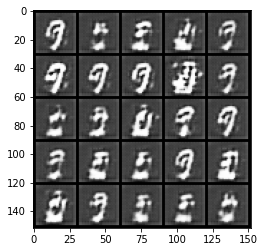

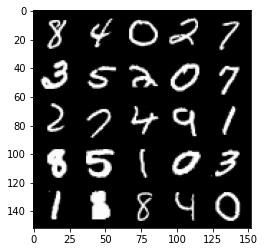

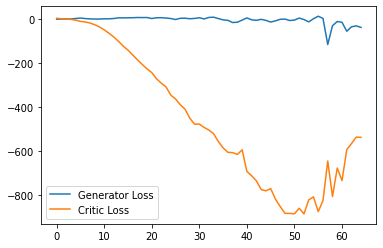

Step 1350: Generator Loss: -68.27636340379715, Critic Loss: -426.687602294922


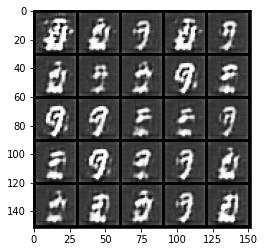

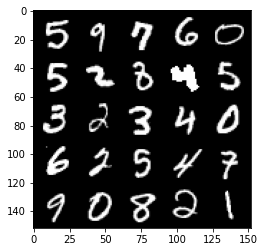

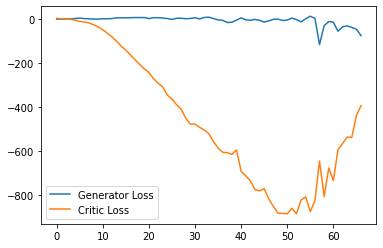

Step 1400: Generator Loss: -65.20987449645996, Critic Loss: -313.6450509643554


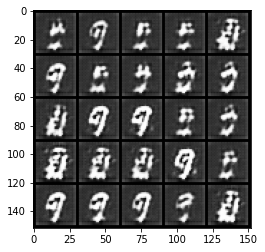

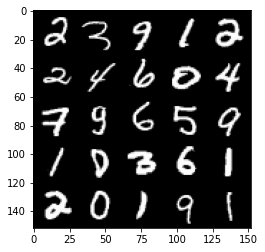

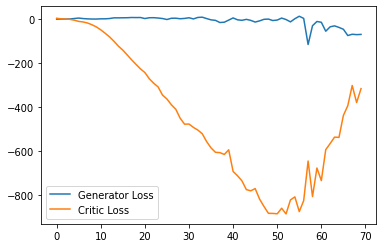

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1450: Generator Loss: -105.3185331594944, Critic Loss: -307.85291442871096


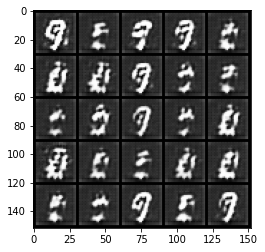

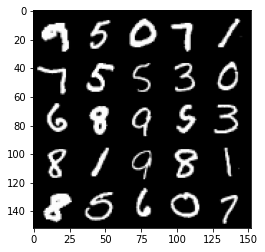

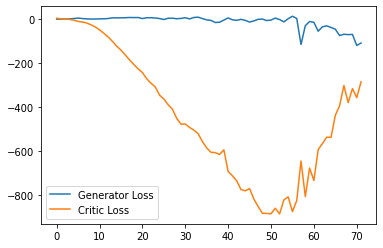

Step 1500: Generator Loss: -98.98093127250671, Critic Loss: -193.98932794189452


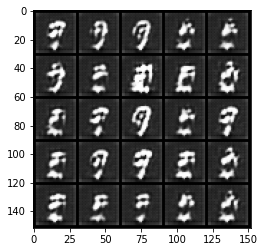

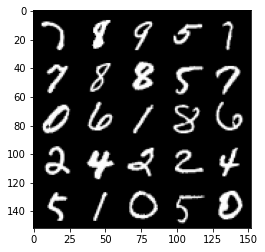

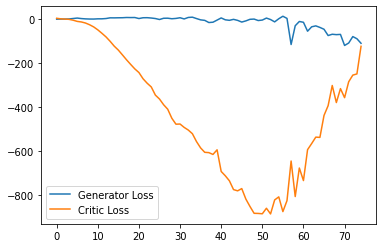

Step 1550: Generator Loss: -55.35396179199219, Critic Loss: 27.09952359008789


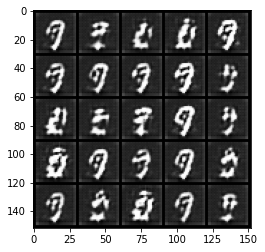

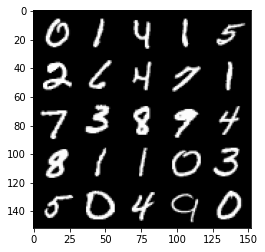

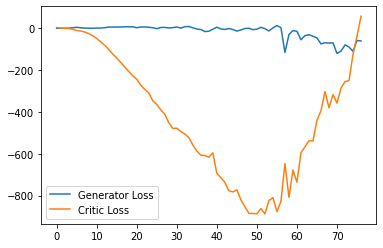

Step 1600: Generator Loss: 31.858881072998045, Critic Loss: 335.2188728027344


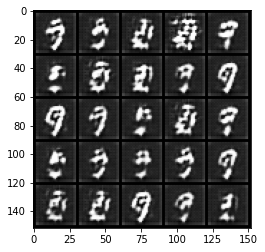

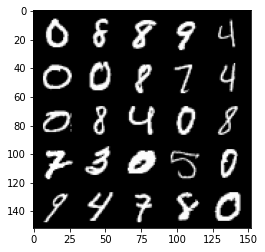

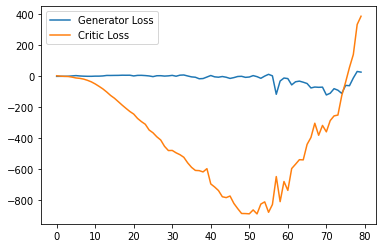

Step 1650: Generator Loss: 22.37651866912842, Critic Loss: 305.1486965942383


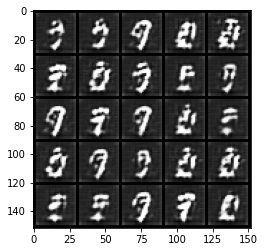

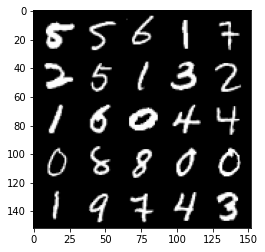

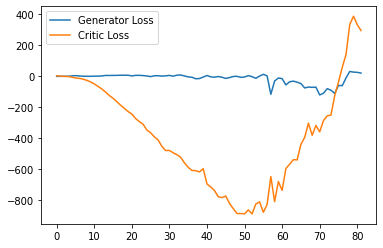

Step 1700: Generator Loss: 22.35638595581055, Critic Loss: 201.83278063964843


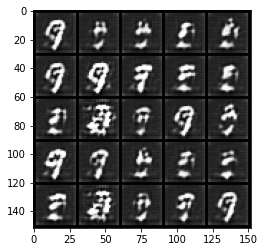

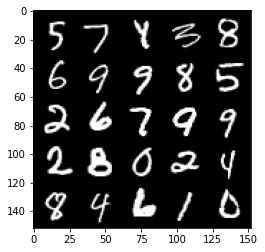

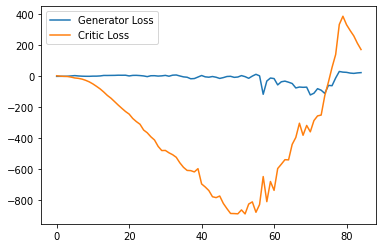

Step 1750: Generator Loss: 21.611388320922853, Critic Loss: 125.25955307006839


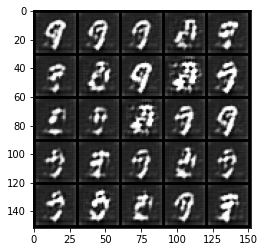

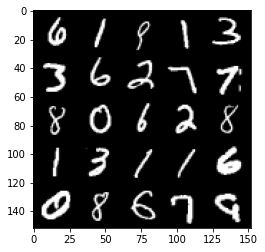

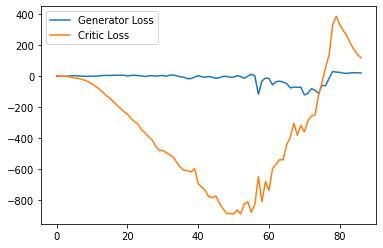

Step 1800: Generator Loss: 17.884214725494385, Critic Loss: 102.33037524414061


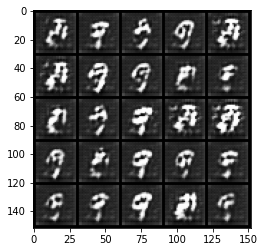

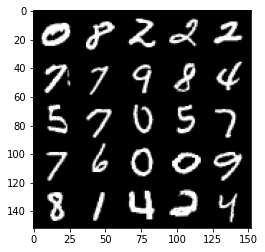

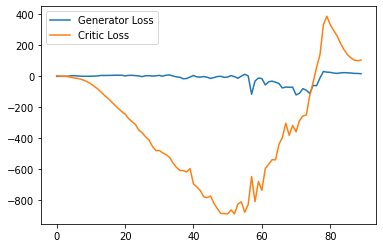

Step 1850: Generator Loss: 17.999707221984863, Critic Loss: 121.930702545166


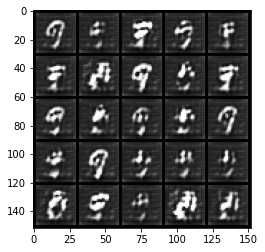

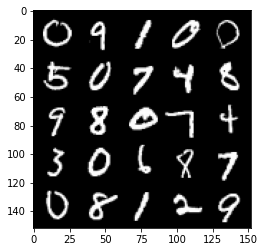

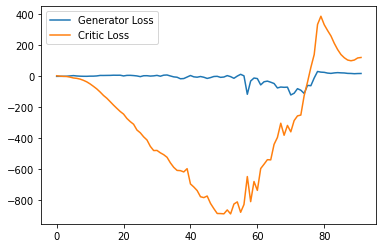

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1900: Generator Loss: 14.821237239837647, Critic Loss: 122.74971392822265


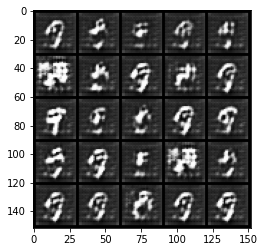

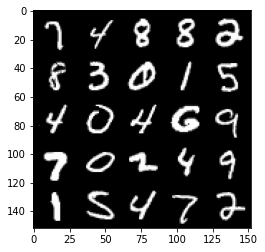

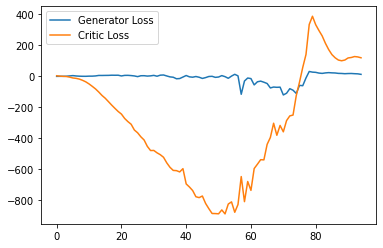

Step 1950: Generator Loss: 9.115072507858276, Critic Loss: 101.30211871337892


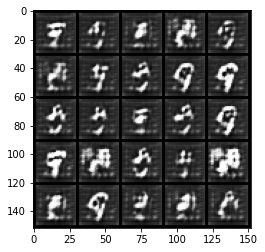

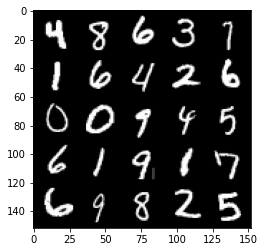

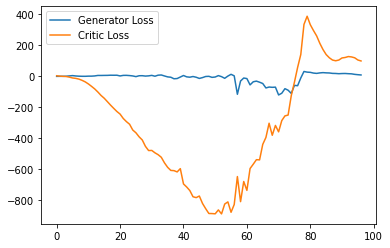

Step 2000: Generator Loss: 3.7826652365922926, Critic Loss: 88.13426284790036


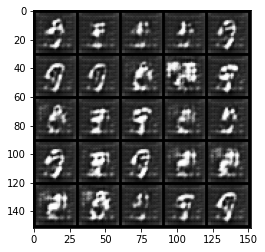

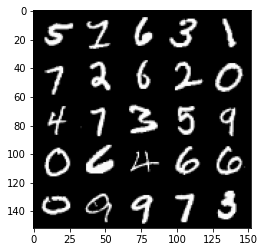

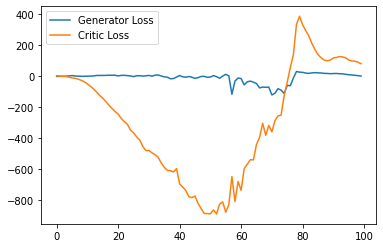

Step 2050: Generator Loss: -1.375964066386223, Critic Loss: 69.06600100708006


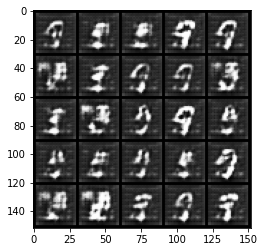

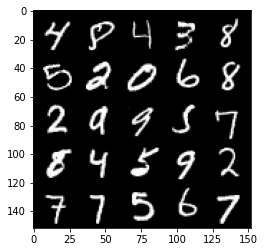

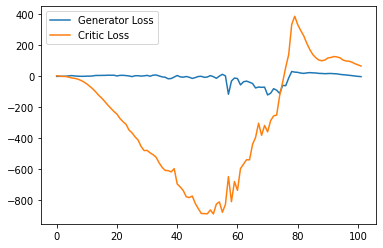

Step 2100: Generator Loss: -2.5506814461946488, Critic Loss: 57.46002423095704


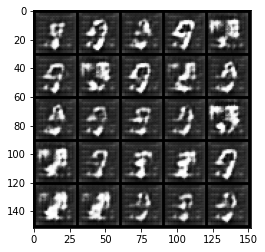

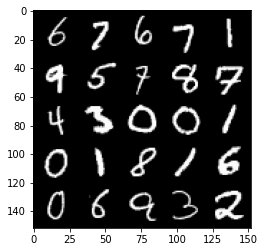

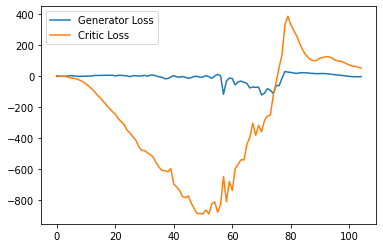

Step 2150: Generator Loss: -3.2810128045082094, Critic Loss: 44.1426851043701


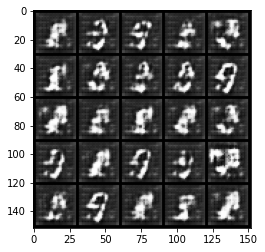

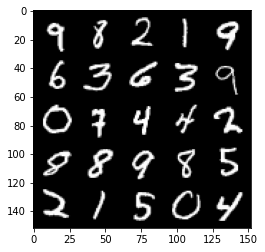

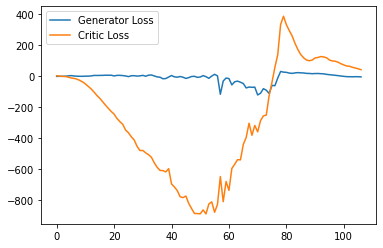

Step 2200: Generator Loss: -4.675304341316223, Critic Loss: 33.861921913146965


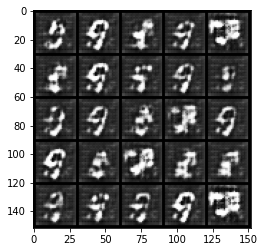

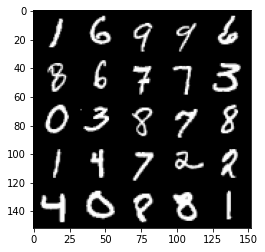

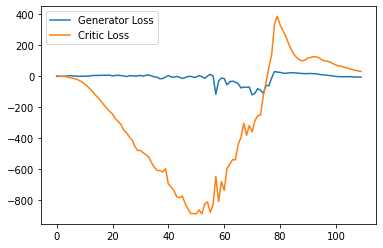

Step 2250: Generator Loss: -3.7348769187927244, Critic Loss: 29.172819534301755


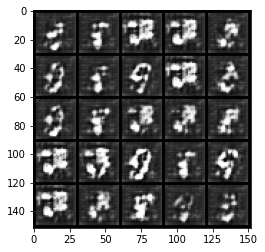

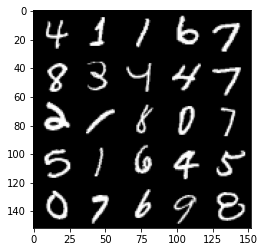

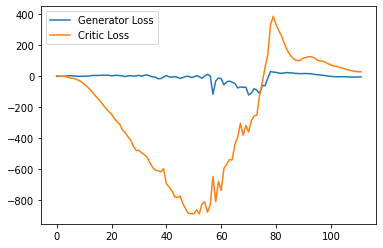

Step 2300: Generator Loss: -4.145944628715515, Critic Loss: 28.666501216888424


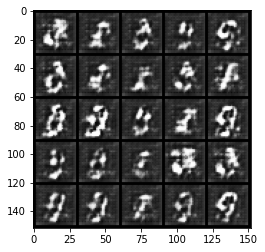

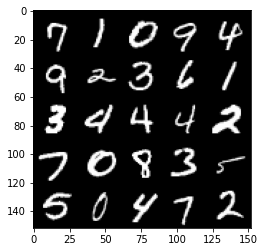

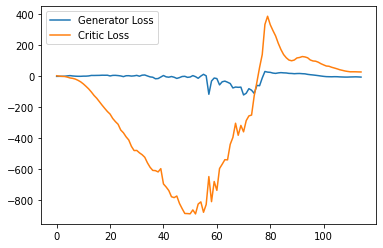

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2350: Generator Loss: -5.524897885322571, Critic Loss: 25.909631351470942


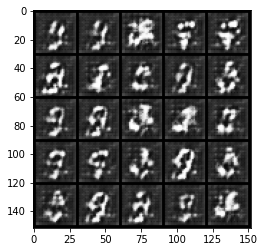

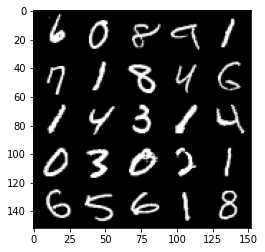

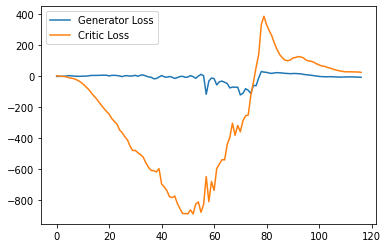

Step 2400: Generator Loss: -5.129216547012329, Critic Loss: 18.44001449966431


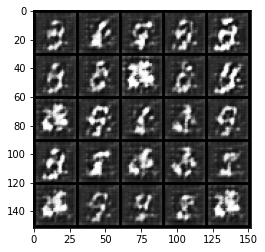

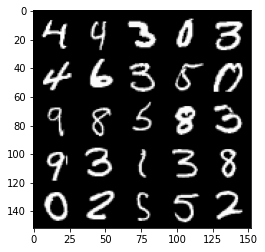

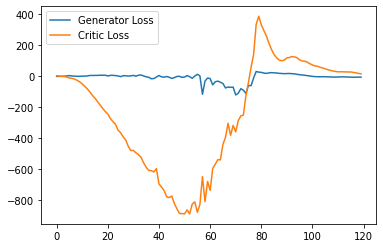

Step 2450: Generator Loss: -4.342862341403961, Critic Loss: 12.767323207855222


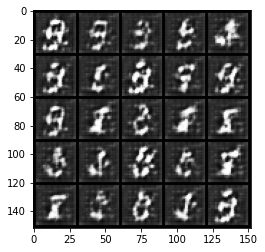

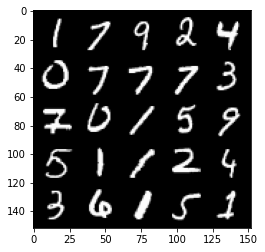

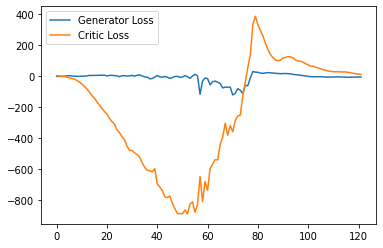

Step 2500: Generator Loss: -3.2241777396202087, Critic Loss: 9.094828479766845


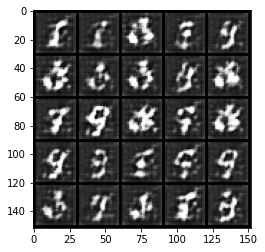

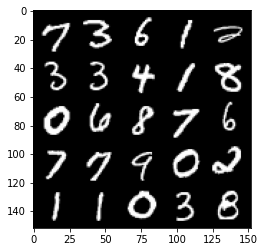

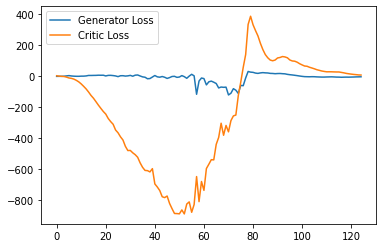

Step 2550: Generator Loss: -2.687131736278534, Critic Loss: 5.255616996765136


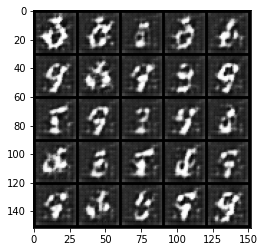

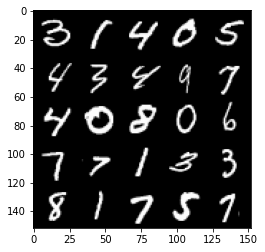

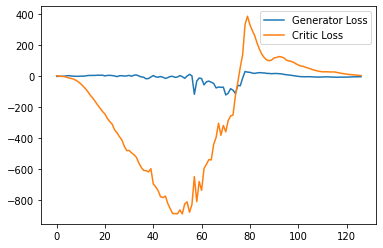

Step 2600: Generator Loss: -3.8520448493957518, Critic Loss: 2.889496341705322


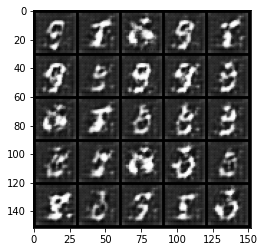

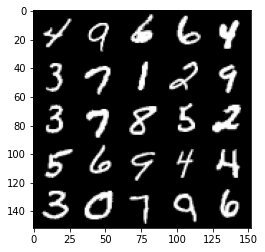

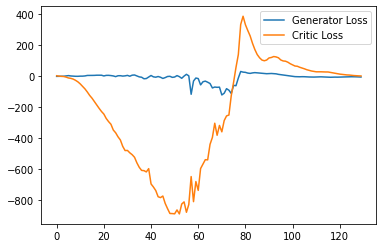

Step 2650: Generator Loss: -7.431974592208863, Critic Loss: 1.5597481842041017


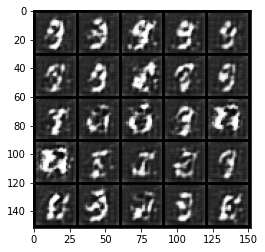

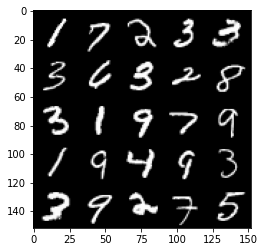

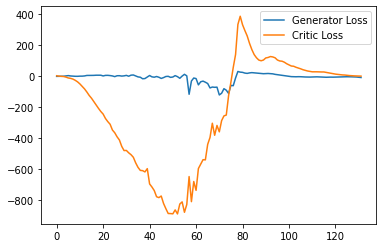

Step 2700: Generator Loss: -12.21575345993042, Critic Loss: 0.08570203590393063


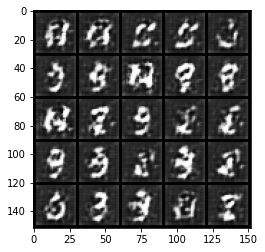

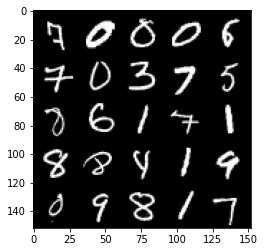

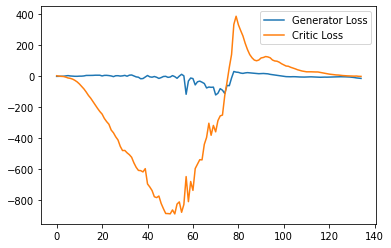

Step 2750: Generator Loss: -14.455263977050782, Critic Loss: -2.2496342582702638


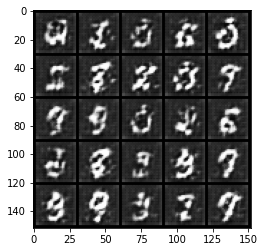

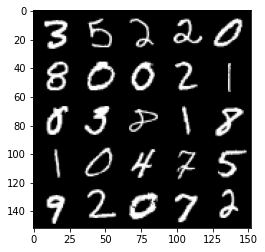

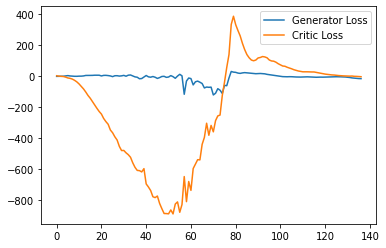

Step 2800: Generator Loss: -15.277869110107423, Critic Loss: -3.962125555038452


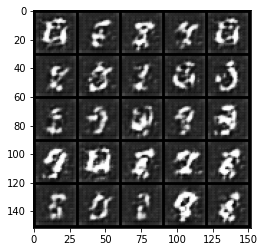

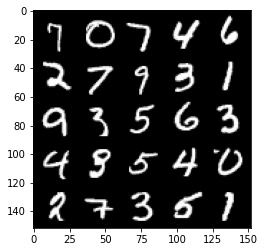

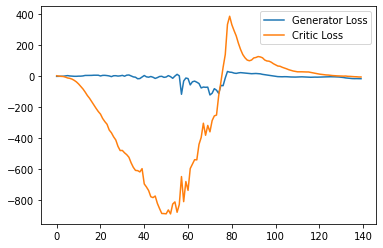

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2850: Generator Loss: -14.895188846588134, Critic Loss: -5.453566707611084


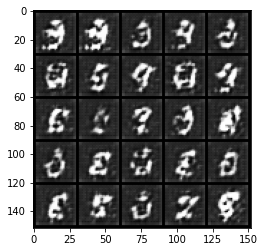

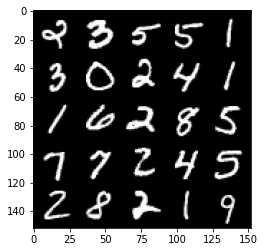

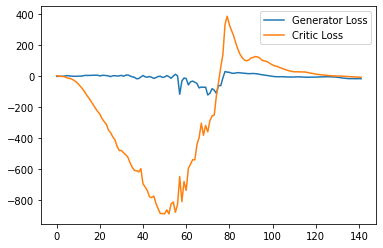

Step 2900: Generator Loss: -12.835890445709229, Critic Loss: -6.76391806793213


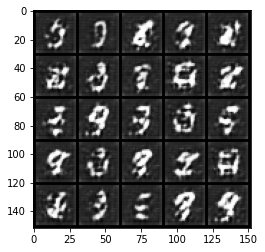

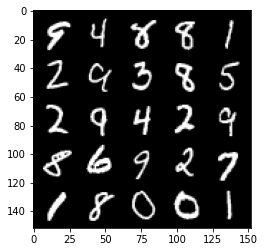

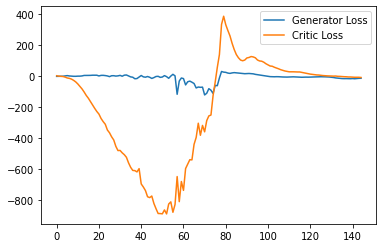

Step 2950: Generator Loss: -10.649199976921082, Critic Loss: -8.685237201690674


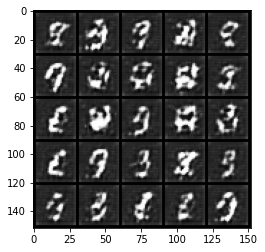

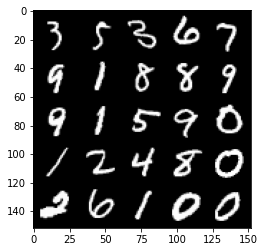

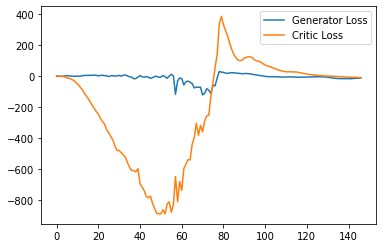

Step 3000: Generator Loss: -8.628717557787896, Critic Loss: -10.440767963409426


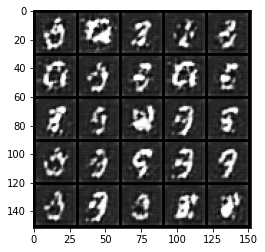

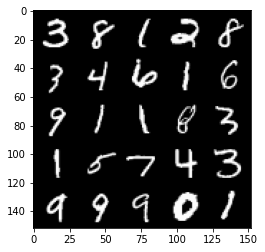

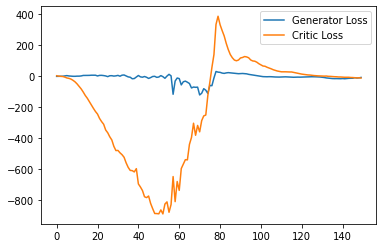

Step 3050: Generator Loss: -7.093476481437683, Critic Loss: -12.587280090332033


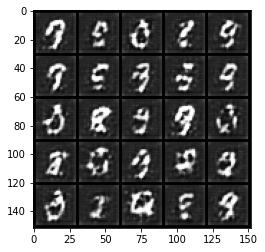

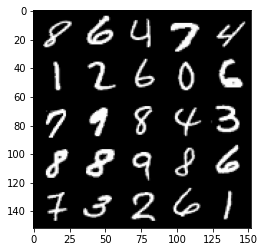

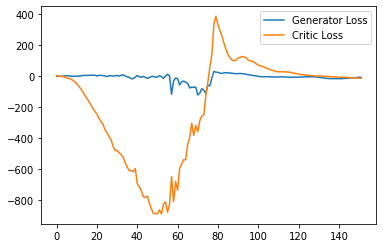

Step 3100: Generator Loss: -4.948773251771927, Critic Loss: -13.878381656646727


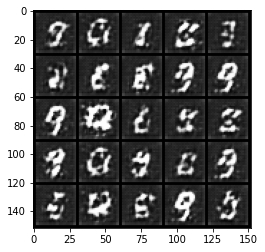

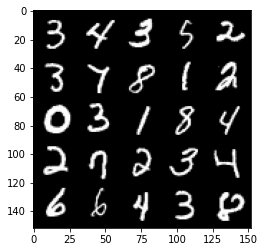

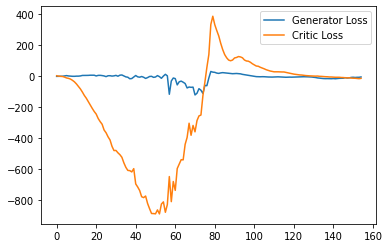

Step 3150: Generator Loss: -2.280609579980373, Critic Loss: -17.057331661224367


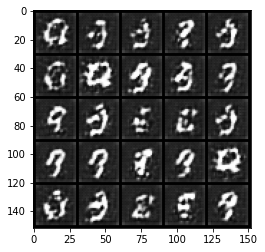

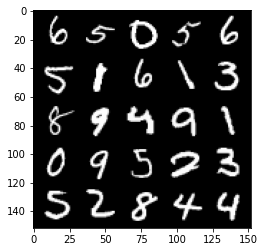

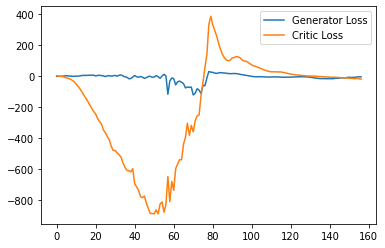

Step 3200: Generator Loss: -0.38257390439510347, Critic Loss: -19.241949855804442


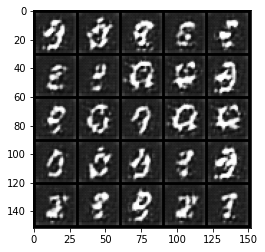

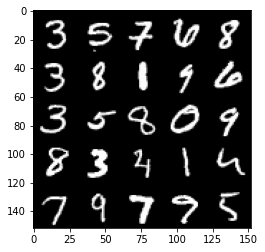

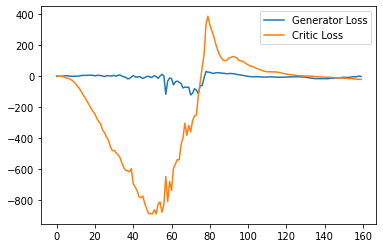

Step 3250: Generator Loss: -1.4936659163236619, Critic Loss: -22.594856651306156


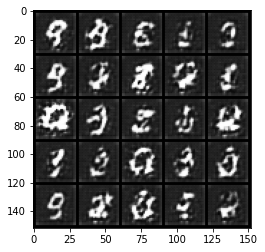

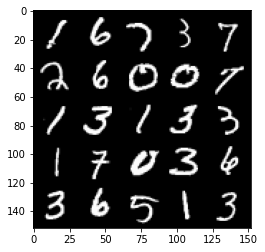

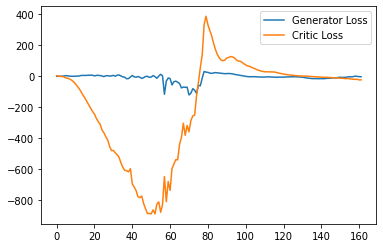

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator Loss: -0.6175906413793564, Critic Loss: -22.96219659042358


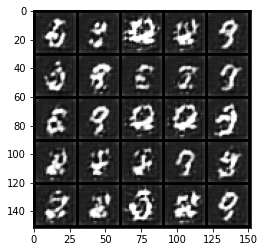

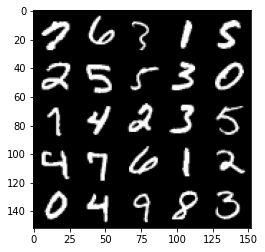

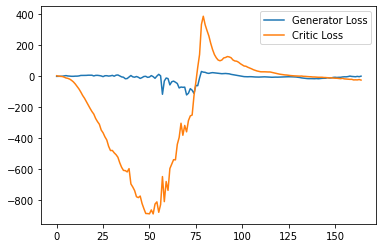

Step 3350: Generator Loss: -1.484160202741623, Critic Loss: -20.731586185455317


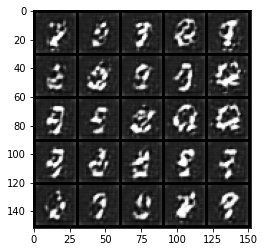

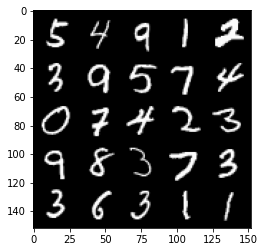

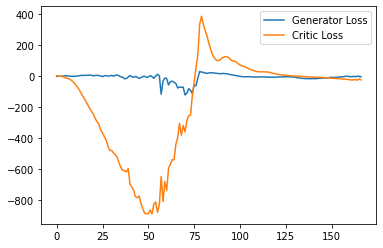

Step 3400: Generator Loss: 1.2092225083708763, Critic Loss: -23.64533574676514


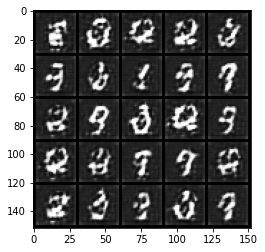

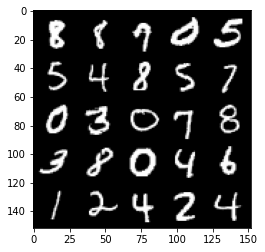

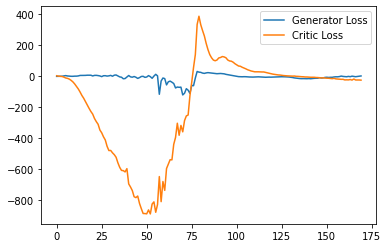

Step 3450: Generator Loss: 6.304881533384323, Critic Loss: -25.14202057266235


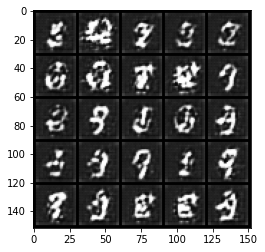

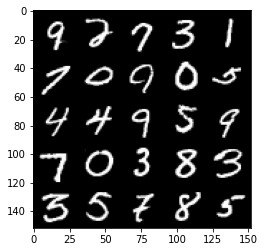

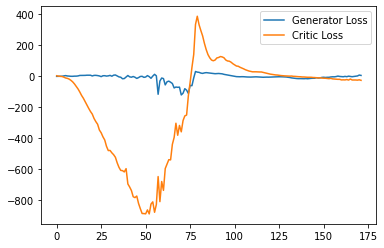

Step 3500: Generator Loss: 8.779206413030625, Critic Loss: -24.0491121635437


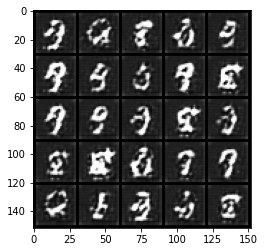

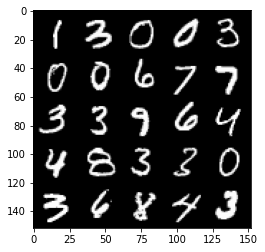

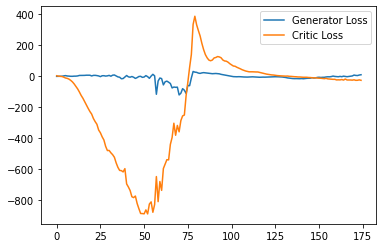

Step 3550: Generator Loss: 11.802363679409027, Critic Loss: -24.693208248138426


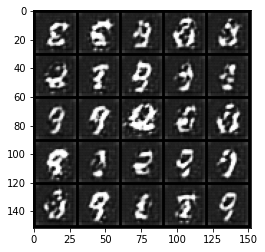

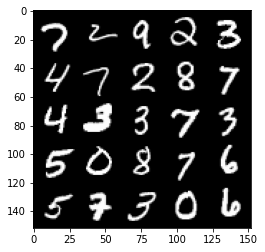

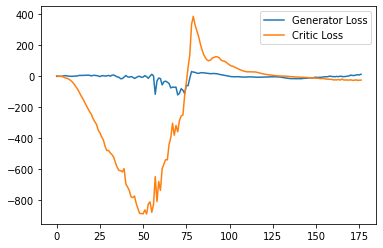

Step 3600: Generator Loss: 11.658470239639282, Critic Loss: -26.019577547073364


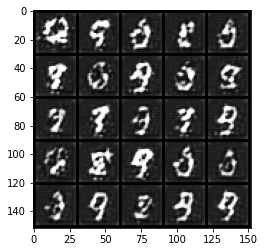

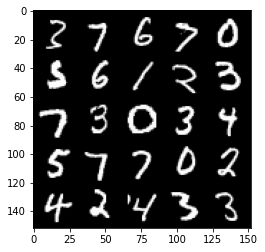

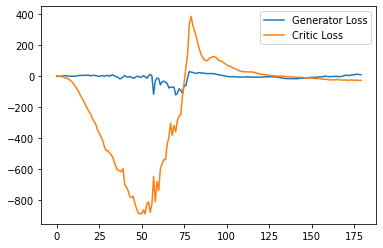

Step 3650: Generator Loss: 15.261109747886657, Critic Loss: -21.295392755508423


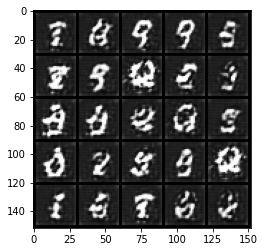

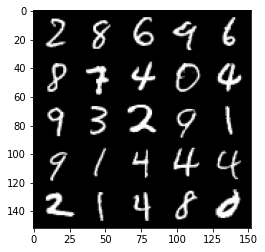

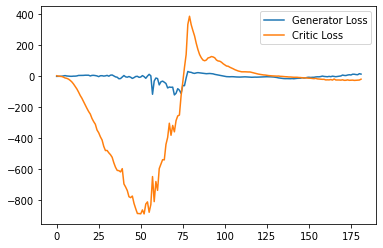

Step 3700: Generator Loss: 16.49405303835869, Critic Loss: -26.33865237236023


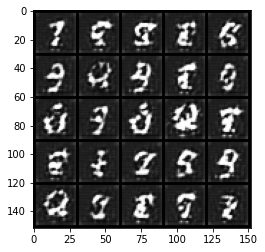

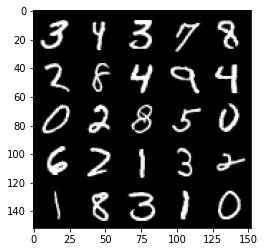

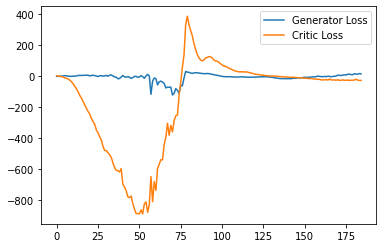

Step 3750: Generator Loss: 20.367708899974822, Critic Loss: -27.215063880920415


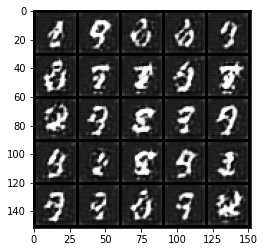

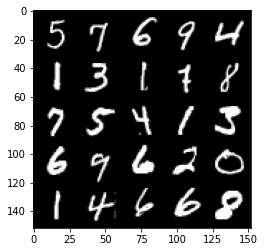

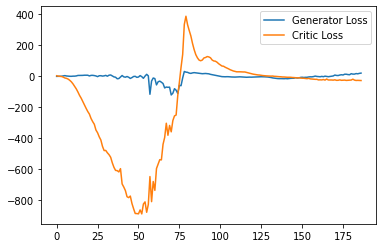

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3800: Generator Loss: 23.786813654899596, Critic Loss: -24.398156847000124


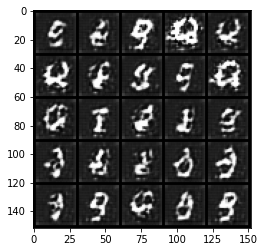

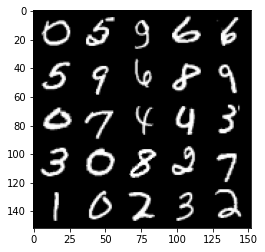

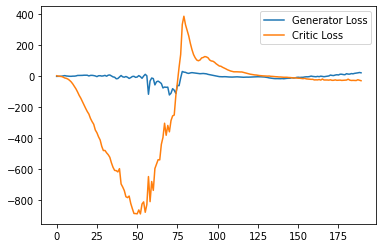

Step 3850: Generator Loss: 24.571181850433348, Critic Loss: -28.591253295898433


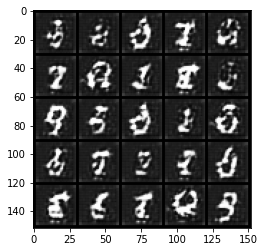

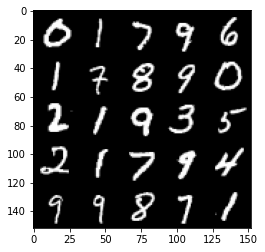

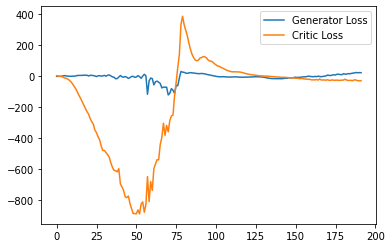

Step 3900: Generator Loss: 26.820114192962645, Critic Loss: -24.273940172195438


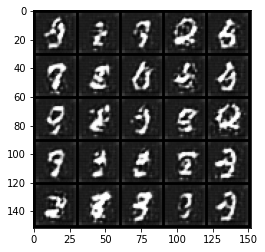

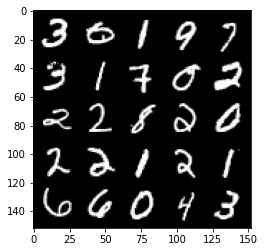

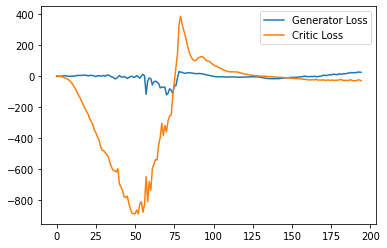

Step 3950: Generator Loss: 29.79268985748291, Critic Loss: -26.733991279602048


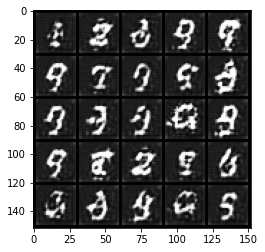

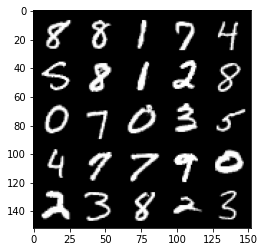

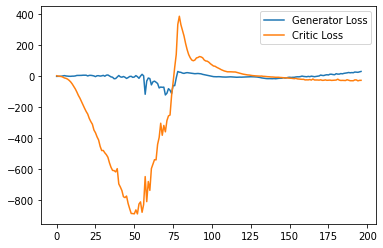

Step 4000: Generator Loss: 31.81100772857666, Critic Loss: -25.739335285186765


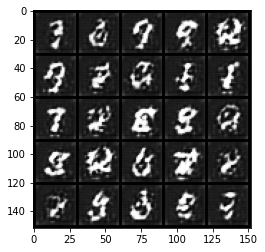

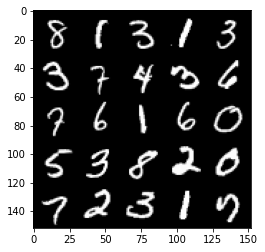

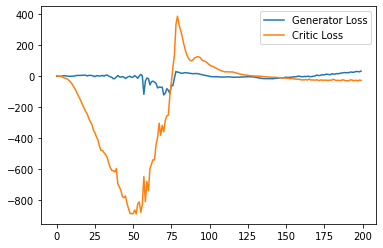

Step 4050: Generator Loss: 33.15524566650391, Critic Loss: -27.355314662933353


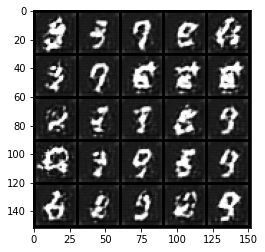

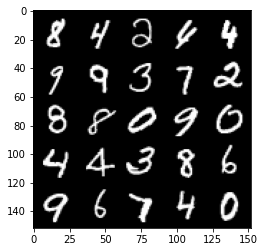

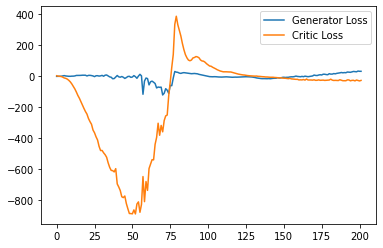

Step 4100: Generator Loss: 36.11844879150391, Critic Loss: -27.02392134857178


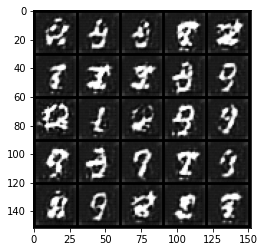

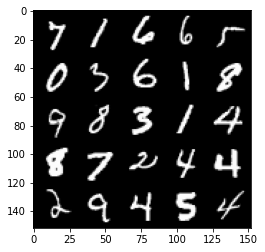

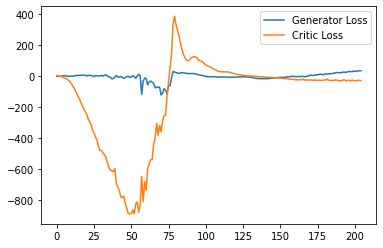

Step 4150: Generator Loss: 38.45060428619385, Critic Loss: -23.76867920684814


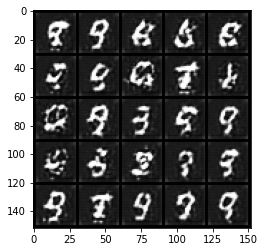

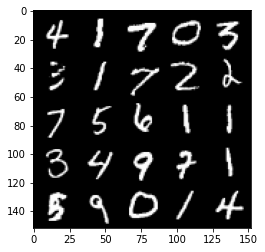

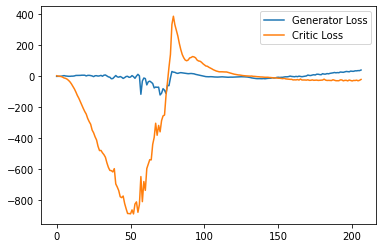

Step 4200: Generator Loss: 38.88589141845703, Critic Loss: -28.253625545501713


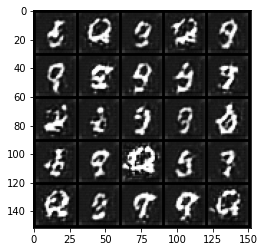

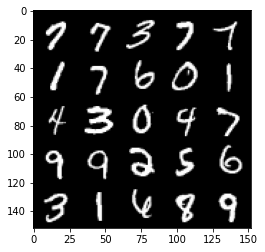

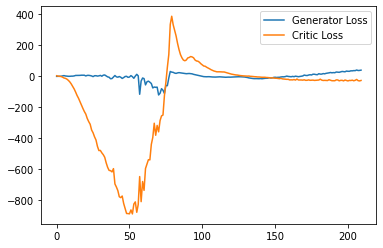

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4250: Generator Loss: 39.78344711303711, Critic Loss: -25.21709312820435


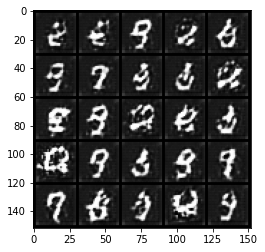

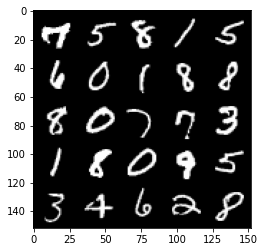

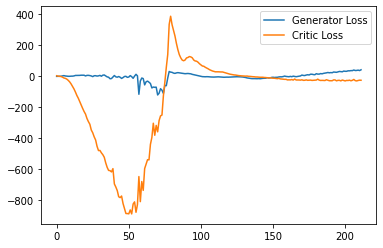

Step 4300: Generator Loss: 42.68563652038574, Critic Loss: -24.379763620376593


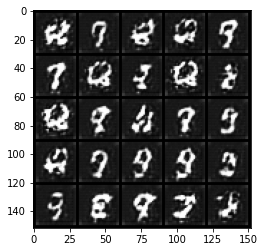

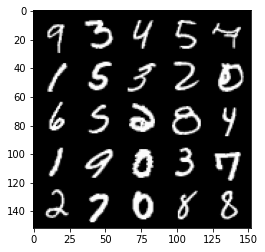

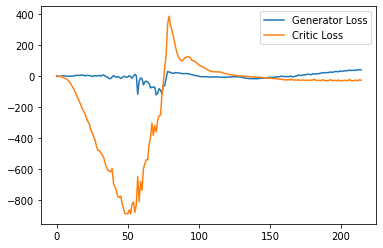

Step 4350: Generator Loss: 46.06692779541016, Critic Loss: -22.529370069503784


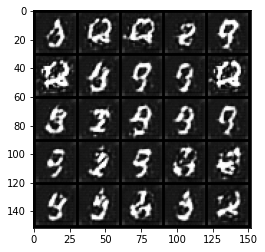

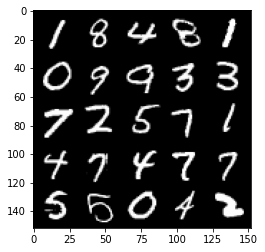

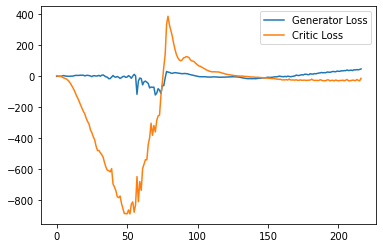

Step 4400: Generator Loss: 47.55044418334961, Critic Loss: -23.03390612792969


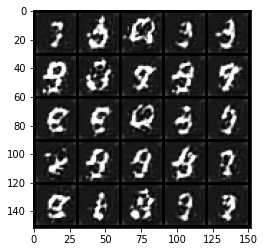

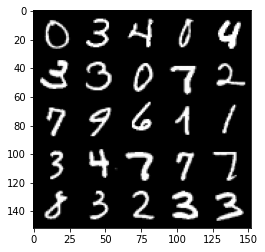

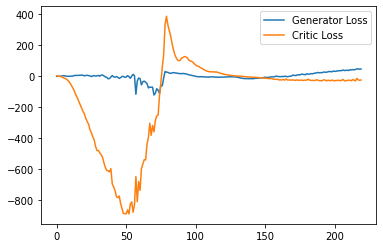

Step 4450: Generator Loss: 45.47003562927246, Critic Loss: -25.35837908172607


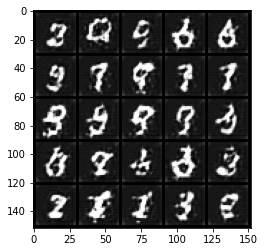

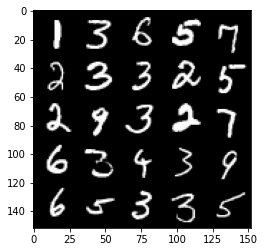

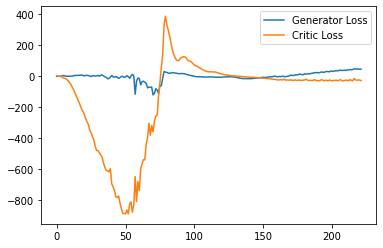

Step 4500: Generator Loss: 45.82871147155762, Critic Loss: -21.589066930770876


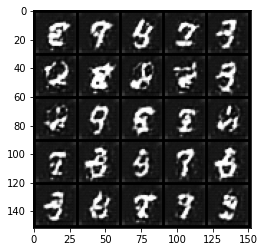

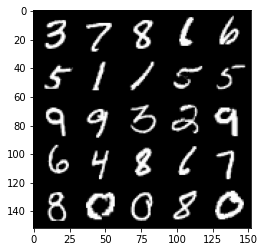

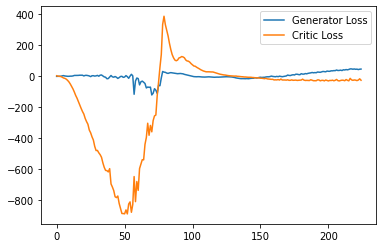

Step 4550: Generator Loss: 47.54250946044922, Critic Loss: -23.91220608520507


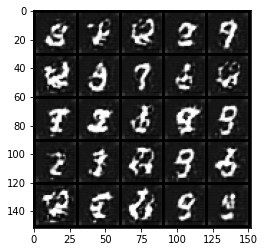

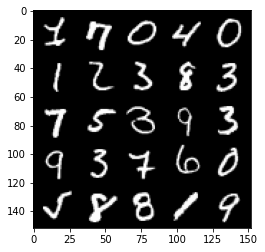

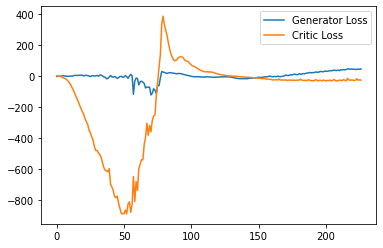

Step 4600: Generator Loss: 49.3631632232666, Critic Loss: -23.41396259307861


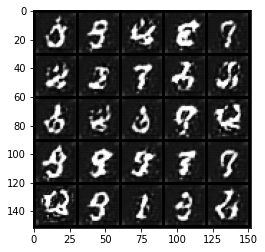

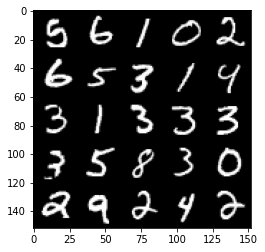

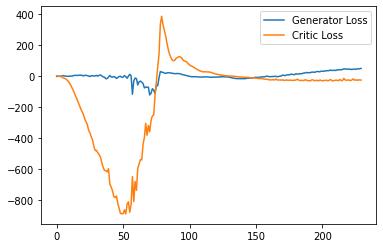

Step 4650: Generator Loss: 49.626195449829105, Critic Loss: -24.984788410186763


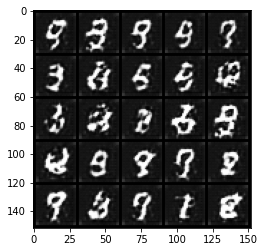

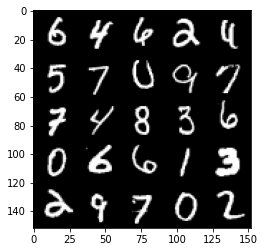

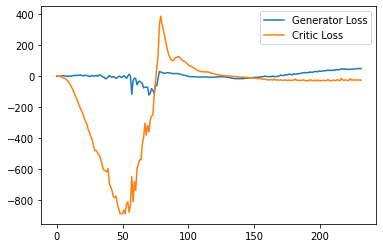

  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
cur_step = 0
gen_losses = []
critic_losses = []
for epoch in range(epochs):
  for image, _ in tqdm(data_loader):
    cur_batch_size = len(image)
    image = image.to(device)

    mean_iter_critic_loss = 0
    for _ in range(cr_per_gen_update):
      # Update critic
      critic_optimizer.zero_grad()
      fake_noise = get_noise_vectors(cur_batch_size, noise_dim, device=device)
      fake = generator(fake_noise)
      critic_fake_pred = critic(fake.detach())
      critic_real_pred = critic(image)

      epsilon = torch.rand(len(image), 1, 1, 1, device=device,requires_grad=True)
      gradient = calc_gradient(critic, image, fake.detach(), epsilon)
      gp = gradient_penalty(gradient)
      crit_loss = critic_loss(critic_fake_pred, critic_real_pred, gp, c_lambda)

      # Average Critic Loss
      mean_iter_critic_loss += crit_loss.item() / cr_per_gen_update
      crit_loss.backward(retain_graph=True)
      critic_optimizer.step()
    critic_losses += [mean_iter_critic_loss]

    # Update Generator
    gen_optimizer.zero_grad()
    fake_noise_g = get_noise_vectors(cur_batch_size, noise_dim, device=device)
    fake_g = generator(fake_noise_g)
    critic_fake_pred = critic(fake_g)

    generator_loss = gen_loss(critic_fake_pred)
    generator_loss.backward()
    gen_optimizer.step()

    # Average Generator Loss
    gen_losses += [generator_loss.item()]

    if cur_step % step == 0 and cur_step > 0:
      gen_mean = sum(gen_losses[-step:]) / step
      crit_mean = sum(critic_losses[-step:]) / step
      print('Step {}: Generator Loss: {}, Critic Loss: {}'.format(cur_step, gen_mean, crit_mean))
      show(fake, 25, (1,32,32), 5)
      show(image, 25, (1,32,32), 5)
      step_bins = 20
      num_examples = (len(gen_losses) // step_bins) * step_bins
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(gen_losses[:num_examples]).view(-1, step_bins).mean(1),
          label="Generator Loss"
      )
      plt.plot(
          range(num_examples // step_bins), 
          torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
          label="Critic Loss"
      )
      plt.legend()
      plt.show()

    cur_step += 1


